Neighborhood Comparison Between Metropolitan Cities
===============================================

## Table of Contents

1. [Introduction](#chapter1)
2. [Business Problem Description](#chapter2)
3. [Data Description](#chapter3)
4. [Methodology](#chapter4)
5. [Results](#chapter5)
6. [Discussion](#chapter6)<br>
    6.1. [Examine Neighborhoods](#section6.1)<br>
    6.2. [Find Similar Neighborhoods](#section6.2)
7. [Conclusion](#chapter7)

## 1. Introduction <a class="anchor" id="chapter1"></a>

The United States and Canada population are increasingly mobile. People move and relocate for various reasons. For example, people move from one metropolitan area to another because they are changing jobs. However, metropolitan areas such as large cities all have their own economic, social, and cultural characteristics and these characteristics are reflected among their unique neighborhoods and communities. For people planning relocation, any knowledge related to the neighborhoods of their destination cities and how they are similar or dissimilar to their current city neighborhoods will be valuable. For example, it may help people find their desired places to live in their new cities.

There are of course many different aspects that we can use when describing city neighborhoods and comparing them, such as populations, housing prices, traffic, and crime rates. For this project, we will focus on neighborhood points of interests (POIs) or venues.

## 2. Business Problem Description <a class="anchor" id="chapter2"></a>

In this project, we will analyze neighborhood venues for Toronto and New York City (NYC) and attempt to answer two related questions:
- When grouping all of Toronto and NYC neighborhoods in terms of nearby venues, what are the different groups and how they are unique from each others?
- When selecting a neighborhood in origin city, what are the similar neighborhoods in the destination city centered around a business location, for example, Google NYC office?

## 3. Data Description <a class="anchor" id="chapter3"></a>

Neighborhood data for NYC will be acquired from this source https://geo.nyu.edu/catalog/nyu_2451_34572. We are interested in the following data elements for each neighborhood contained in the file:
- Borough name
- Neighborhood name
- Neighborhood's latitude and longitude coordinates

Neighborhood data for Toronto will be acquired from Wikipedia page https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M. Because this source doesn't provide latitude and longitude coordinates, a Geocoder Python package https://geocoder.readthedocs.io/index.html will be used to produce the coordinates for each Toronto neighborhood.

Also, we will use the Foursquare API to explore neighborhoods in NYC and Toronto. Specifically, Foursquare API provides explore functions to get venues and venue categories in each neighborhood. These venues will be used as features to group the neighborhoods into clusters.

## 4. Methodology <a class="anchor" id="chapter4"></a>

### 4.1 Neighborhoods and Lat/Lon Coordinates

NYC neighborhoods data acquired from the source is fairly clean and doesn't require any wrangling. However, for Toronto neighborhoods data scraped from Wikipedia page,we had to conduct the following transformation:
- Neighborhoods and postal codes with no assigned boroughs are dropped
- Lat/Lon coordinates for postal codes from separate data source are joined with above neighborhoods data

There are 306 neighborhoods in 5 boroughs in NYC. And there are 103 neighborhoods in 10 boroughs in Toronto.

### 4.2 Neighborhood Venues

Foursquare API is used to obtain neighborhood nearby venues and venue categories. For each neighborhood, radius 400 meters and venue limit 100 are used.

There are 415 uniques venue categories and 7717 venues for NYC neighborhoods. And there are 245 uniques venue categories and 1637 venues for Toronto neighborhoods.

### 4.3 Master Neighborhood Venues

We now have neighborhoods for both NYC and Toronto and their nearby venues in separate dataframe. Before we can compare them, we need to combine their neighborhoods venue data into a master dataframe. Since neighborhood names can be the same in the two cities, and we want to know which city a particular neighborhood belongs to, we will add city name to the neighborhood names when creating the master neighborhoods dataframe so that they are unique.

### 4.4 One-hot Encoding Venue Categories

Since we will group neighborhoods according to types of nearby venues (i.e., venue categories) using cluster algorithm, we need to one-hot encode the venue categories.

We group the neighborhood venues dataframe by neighborhood and take the mean of the frequency of occurrence of each venue category. This will be used as the input data when running cluster algorithm.

### 4.5 Group NYC and Toronto Neighborhoods to Clusters

We chose K-Means clustering algorithm for these reasons:
- It is simple and fast
- It is un-supervised model, which makes sense in our case as we don't yet know what kinds of neighborhoods would be from nearby venues

We chose K = 3 after experimented with other K values. An alternative would be using elbow method to determine the best K value.

One future improvement would be using K-Means++ as it may help picking the initial cluster centroids. 

## 5. Results <a class="anchor" id="chapter5"></a>

The entire neighborhoods in NYC and Toronto are grouped into three clusters.

This is the NYC neighborhoods map showing all clusters: 

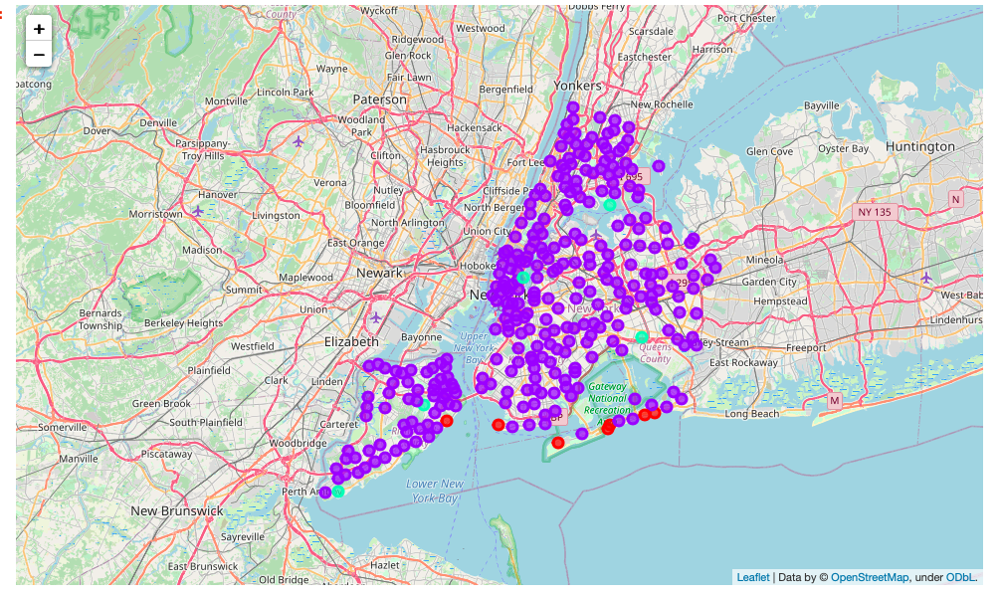

This is the Toronto neighborhoods map showing all clusters:

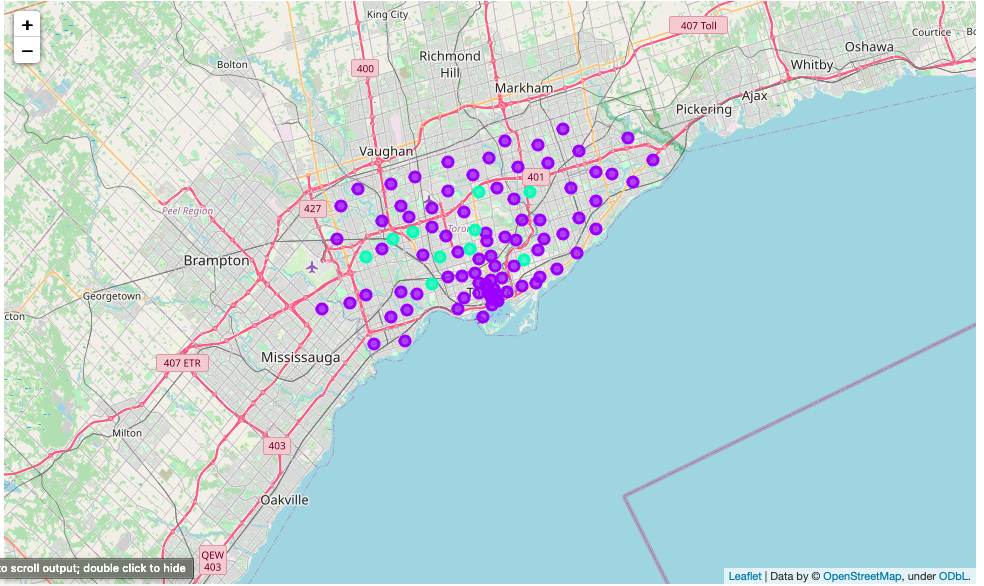

## 6. Discussion <a class="anchor" id="chapter6"></a>

### 6.1 Examine Neighborhood Clusters <a class="anchor" id="section6.1"></a>

Recall that one of the goals of this project is to discover how NYC neighborhoods and Toronto neighborhoods are similar or dissimilar, in terms of nearby venues. So, let us examine each neighborhood clusters.

#### 6.1.1 Beach Cluster

A couple of interesting observations:
- We call cluster 1 Beach Neighborhood, as neighborhoods in this cluster have most beach, yoga studio, and related venues.
- However, these are all NYC neighborhoods; Toronto doesn't have any neighborhoods in this cluster.
- If you look at the NYC and Toronto maps below showing this cluster, this seems to make sense, as Toronto doesn't have beech neighborhoods.

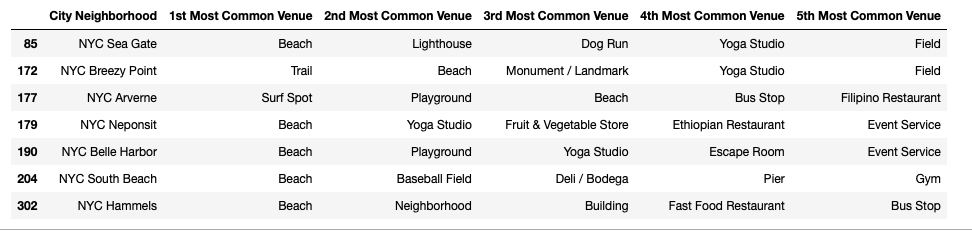

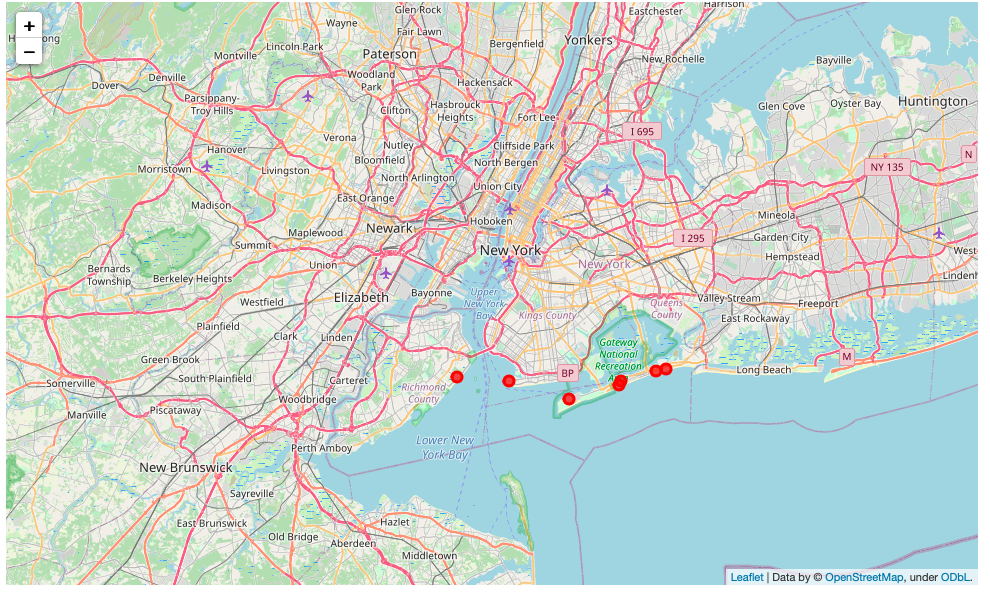

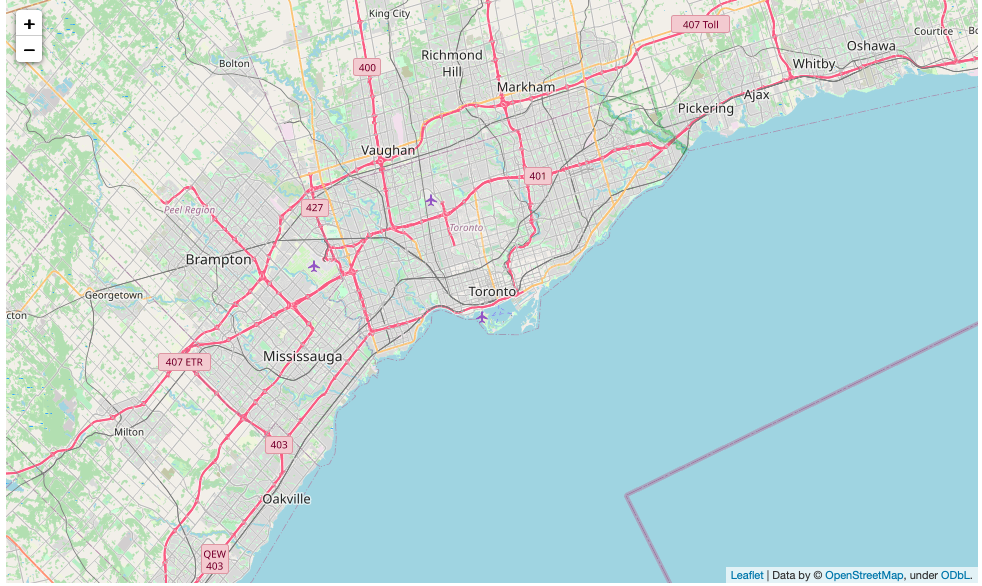

#### 6.1.2 Restaurant and Food Cluster

Large number of both NYC and Toronto neighborhoods are in this cluster. Many of them have various types of restaurants, coffee shops, bakeries as their most common venues. 

For example, all neighborhoods listed below have Chinese Restaurant as their 1st most common venue. However, one thing is kind of surprising: only one Toronto neighborhood has Chinese Restaurant as its 1st most common venue, the rest are all in NYC.

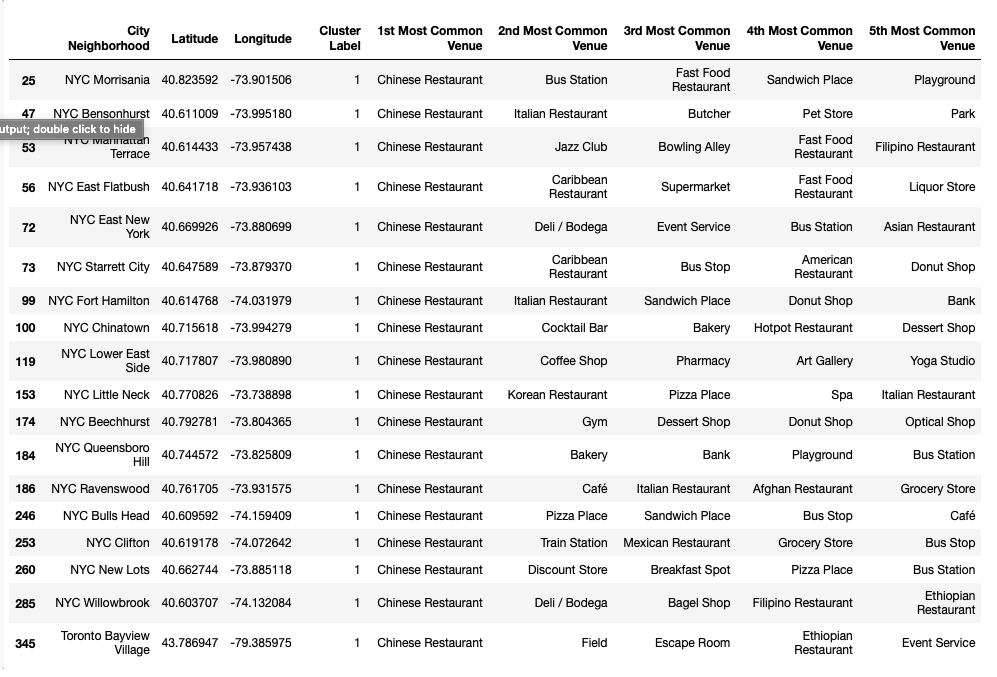

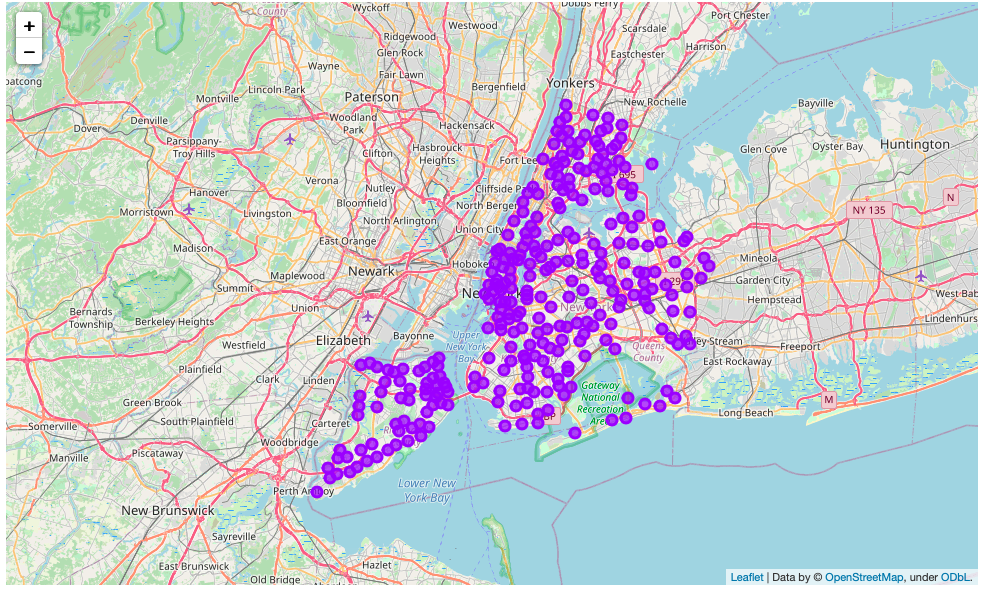

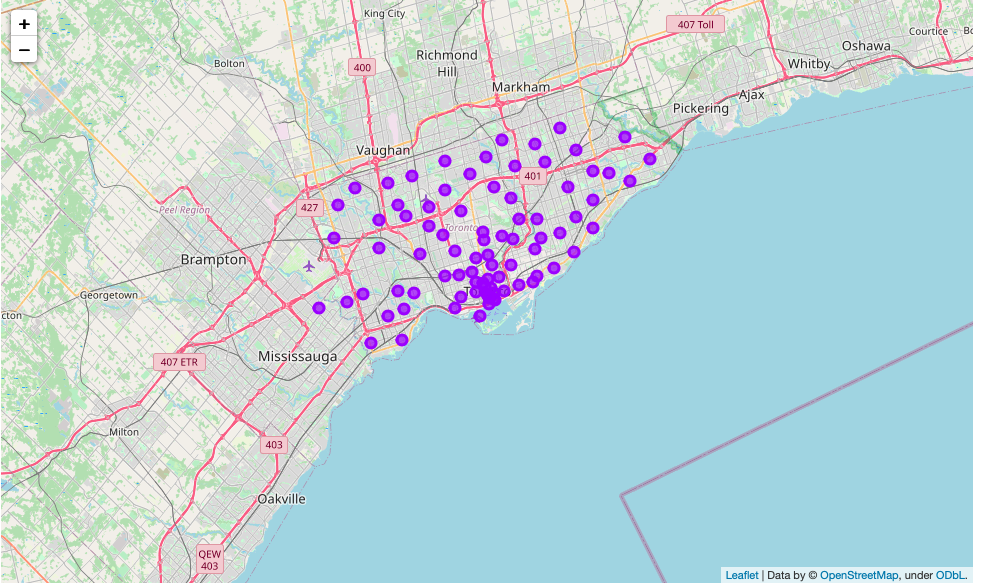

#### 6.1.3 Park Cluster

Some observations for this neighborhood cluster:
- Neighborhoods in this cluster have **most parks and park related venues**.
- Toronto has many more park neighborhoods than NYC, which is not that surprising given that NYC is much more densely populated and real estates are more developed. 
- All neighborhoods in this cluster tend to be outside the downtown and in around suburbs, again not surprising.

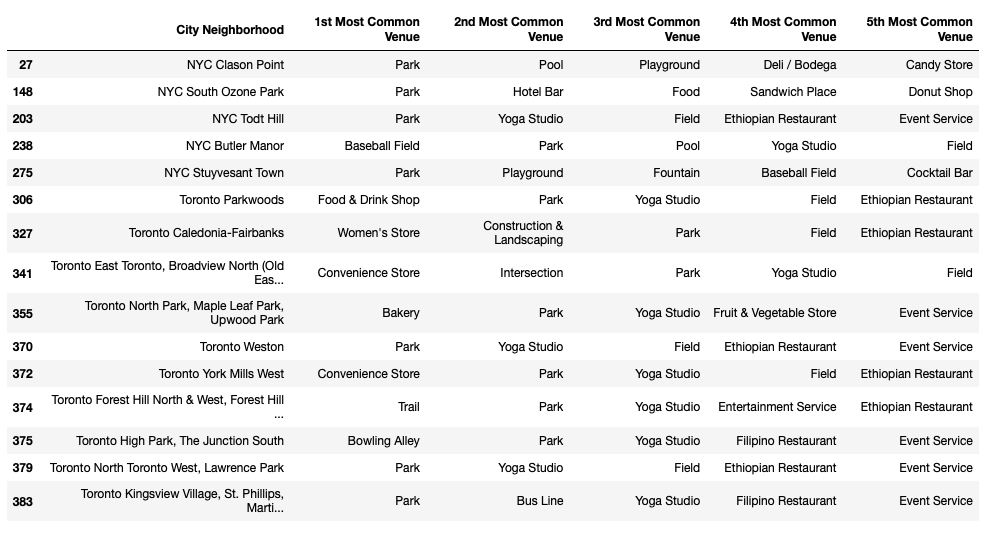

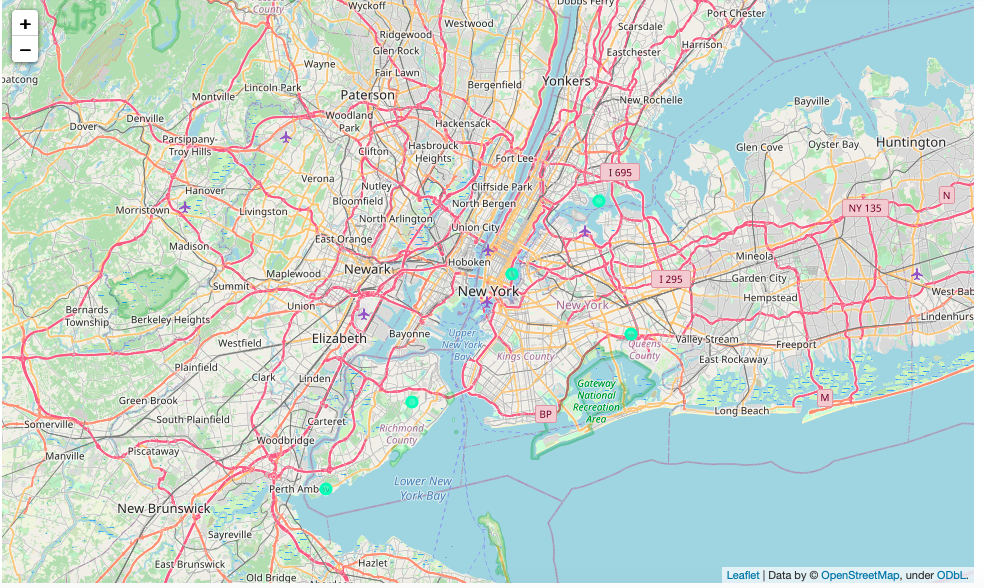

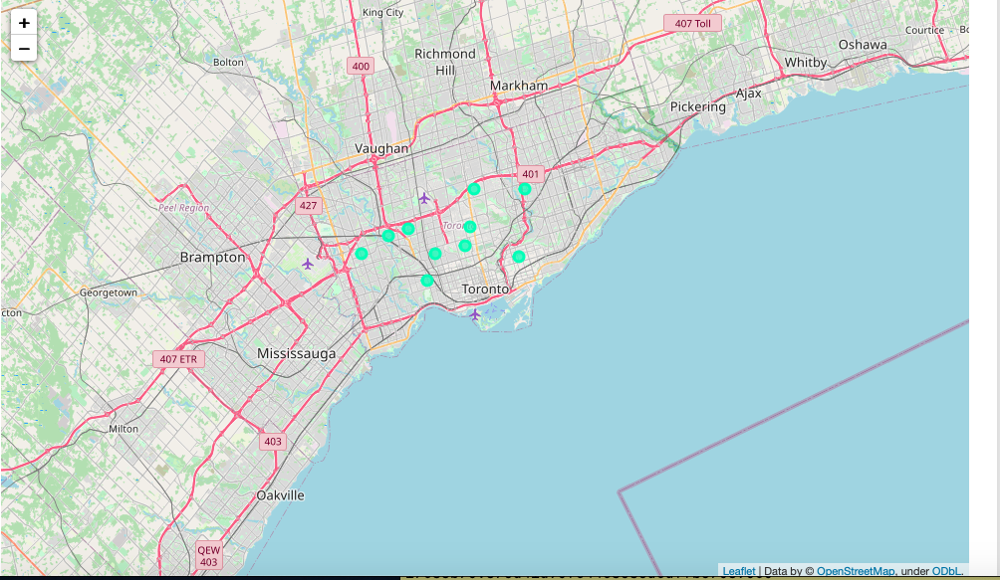

### 6.2. Find Similar Neighborhoods <a class="anchor" id="section6.2"></a>

Recall that another goal of this project is that given a neighborhood in origin city, determine the similar neighborhoods in the destination city centered around a business location, for example, Google NYC office?

Let us demonstrate this using **Toronto Weston** as the origin city and neighborhood. We want to find all similar neighborhoods in NYC, display them on a map and also show the location of **Google NYC office**.

These are the NYC neighborhoods which are similar with Toronto Weston Neighborhood:

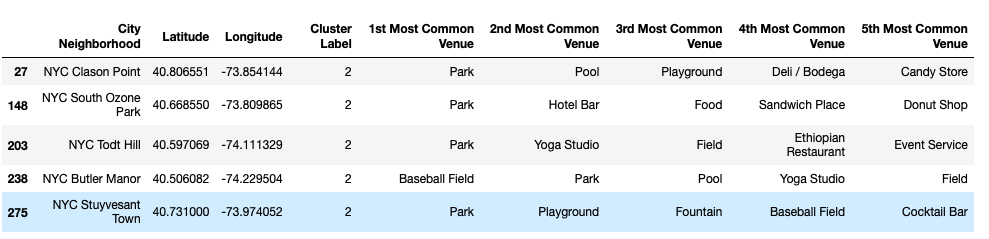

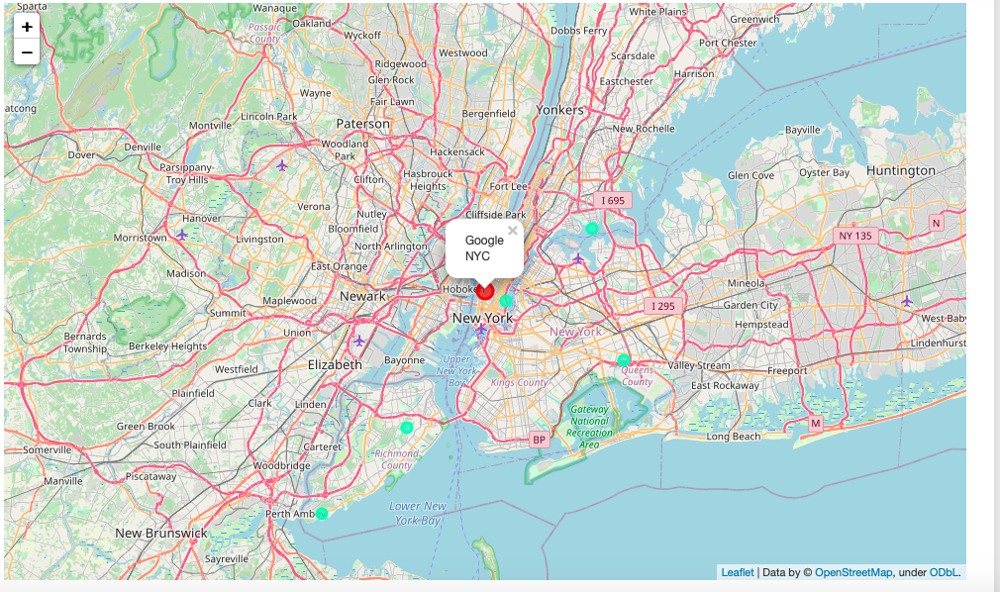

So, if you currently live in Toronto Weston neighborhood, and you are considering a job offer to move to NYC to work for Google, these NYC neighborhoods would be similar in terms of enjoying nearby parks, according to our neighborhood data analysis.  

## 7. Conclusion <a class="anchor" id="chapter7"></a>

In this project, we have used unsupervised K-Means Clustering algorithm to develop a model which groups NYC and Toronto neighborhoods. The features used for grouping are neighborhoods' nearby venues and venues' categories. Foursquare API are used to acquire neighborhood's venues.

Entire neighborhoods in NYC and Toronto are grouped into three distinct clusters: Beach neighborhood, Restaurant and Food neighborhood, and Park neighborhood. Observations are made regarding on the similarity and difference between NYC and Toronto. In addition, given a neighborhood in origin city (such as Toronto Weston), this model can find similar neighborhoods in the destination city (NYC) centered around a business location, for example, Google NYC office. 